In [451]:
from PIL import Image, ImageDraw, ImageFont, ExifTags, ImageOps
from colorthief import ColorThief
import blend_modes as bm
import numpy as np

In [355]:
Social = True

In [454]:
def add_border(image, Label = [], padding_ratio = 0.04, watermark_ratio = 1.4):
    
    global imagepath
    
    Rotated = False
    width, height = image.size
    
    print(width, height)
    
    
    
    if width < height:
        
        image = image.rotate(90, expand=True)
        Rotated = True
        width, height = image.size
        
        print("Rotated", width, height)

    
    if Label != []:
        Lwidth, Lheight = Label.size
        Lratio = Lwidth / Lheight

    # Create a new image with a border
    border_size = max(width, height) * padding_ratio
    new_width = int(width + 2 * border_size)
    new_height = int(height + 2 * border_size)
        
    new_dim = new_width
    
    offset = (int(border_size), int((new_dim - new_height)/2 + border_size))

    Watermark_size = int((new_dim - height)//2 * watermark_ratio)


    

    color_thief = ColorThief(imagepath)
    # get the dominant color
    dominant_color = color_thief.get_color(quality=500)
    
    dom_R, dom_G, dom_B = dominant_color
    
    if (dom_R*0.299 + dom_G*0.587 + dom_B*0.114) > 150: #186:
        print("Light")
        Watermark = Image.open("./Private/_MarkD.png")
        Method = bm.multiply
        
        Light = True
        
    else:
        print("Dark")
        Watermark = Image.open("./Private/_MarkW.png")
        Method = bm.screen
        
        Light = False
    
    new_image = Image.new("RGB", (new_dim, new_dim), dominant_color)
    new_image.paste(image, offset)
    
    

    print("Watermark Size",Watermark_size)
    
    Watermark = Watermark.resize((Watermark_size, Watermark_size))  
    if Label != []:
        LabelImage = Image.new("RGB", (new_dim, new_dim), (0,0,0))
        Lheight = Watermark_size
        Lwidth = int(Lheight * Lratio)
        
        Label = Label.resize((Lwidth, Lheight))

        Loffset = (new_dim-Lwidth, new_dim - Lheight)
        LabelImage.paste(Label, Loffset)
        
        if Light:
            LabelImage = ImageOps.invert(LabelImage)
        LabelImage.show()
    
    #Woffset = ((new_dim - Watermark_size)//2, (new_dim - Watermark_size))
    Woffset = (int(0.25 * Watermark_size), (new_dim - Watermark_size))
    
    new_image.paste(Watermark, Woffset, Watermark)
    
    if Label != []:
        alpha = Image.new('L', new_image.size, 255)

        new_image.putalpha(alpha)
        new_image.show()
        LabelImage.putalpha(alpha)
        LabelImage.show()
        
        background_img = np.array(new_image).astype(float)
        foreground_img = np.array(LabelImage).astype(float)

        # Blend images
        opacity = 1  # The opacity of the foreground that is blended onto the background is 70 %.
        blended_img_float = Method(background_img, foreground_img, opacity)

        # Convert blended image back into PIL image
        blended_img = np.uint8(blended_img_float)  # Image needs to be converted back to uint8 type for PIL handling.
        new_image = Image.fromarray(blended_img)  # Note that alpha channels are displayed in black by PIL by default.
                                                        # This behavior is difficult to change (although possible).
                                                        # If you have alpha channels in your images, then you should give
                                                        # OpenCV a try.


    if Rotated:
        new_image = new_image.rotate(270)
    return new_image

In [459]:
import pandas as pd
from PIL.ExifTags import TAGS

def exif_to_table(image_path):
    # Open image
    image = Image.open(image_path)
    # Retrieve EXIF data
    exif_data = image._getexif()
    # Create a dictionary to store the EXIF data
    exif = {}
    for tag_id, value in exif_data.items():
        tag = TAGS.get(tag_id, tag_id)
        exif[tag] = value
    # Extract the relevant EXIF data
    title = input("Enter Title Here") or 'Untitled'
    
    exif_data = image.getexif()
    
    # Get the date and time from the EXIF data
    date_time_str = exif_data[0x9003]
    timezone_offset = exif_data.get(0x882a)
    
    print(timezone_offset)

    if timezone_offset is not None:
        print("Ha!")

    # Convert the date and time string to a datetime object
    date_time = datetime.strptime(date_time_str, '%Y:%m:%d %H:%M:%S')

    # Format the date and time in the desired format
    formatted_date_time = date_time.strftime('%Y:%m:%d %H:%M')

    print(formatted_date_time)
    camera = exif.get('Model', 'N/A')
    aperture = exif.get('FNumber', 'N/A')
    iso = exif.get('ISOSpeedRatings', 'N/A')
    shutter_speed = exif.get('ExposureTime', 'N/A')
    
    if shutter_speed != "N/A":
        shutter_speed = float(shutter_speed)
        
        if shutter_speed < 1:
            
            shutter_speed = f"1/{np.round(1/shutter_speed,0):.0f}"
            
        else:
            shutter_speed = f"{shutter_speed:.1f}\""
    
    focal_length = exif.get('FocalLength', 'N/A')
    # Create a dataframe to store the data
    data = {"": [title], 'Time':[formatted_date_time], 'Camera': [camera], 'Aperture': [aperture], 'ISO': [iso], 'Shutter speed': [shutter_speed], 'Focal length': [focal_length]}
    df = pd.DataFrame(data)
    return df

In [427]:
import matplotlib.pyplot as plt

In [428]:
import matplotlib
matplotlib.rcParams.update({'font.size': 18, 'font.family': "Avenir Next"})

def print_table_as_image(tables, color = (0,0,0)):
    fig, axs = plt.subplots(3, 1, facecolor = color, dpi = 300, figsize = (16,8))
    
    for ax,table in zip(axs,tables):
        
        print(ax)
        ax.axis('off')
        ytable = ax.table(edges='vertical',cellText=table.values, colLabels=table.columns,loc = 'center',cellLoc = 'center')
        ytable.set_fontsize(28)
        ytable.scale(1, 4)
        ytable_cells = ytable.properties()['children']
        for cell in ytable_cells: 
                cell.get_text().set_fontsize(50)
                cell.get_text().set_color('white')
    
    plt.show()
    return fig, ax

In [429]:
from datetime import datetime


In [430]:
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas

def figure_to_image(figure):
    canvas = FigureCanvas(figure)

    s, (width, height) = canvas.print_to_buffer()

    return Image.frombytes("RGBA", (width, height), s)

In [431]:
def Exif_to_Digest(imagepath):
    
    df = exif_to_table(imagepath)
    dfr1 = df[[""]]
    dfr2 = df[["Time", "Camera"]]
    dfr3 = df[["Aperture","ISO","Shutter speed","Focal length"]]
    
    fig, ax = print_table_as_image([dfr1,dfr2,dfr3])
    
    return figure_to_image(fig)

Enter Title HereBlue Mountains Lookout
None
2022:12:21 17:10
AxesSubplot(0.125,0.657941;0.775x0.222059)
AxesSubplot(0.125,0.391471;0.775x0.222059)
AxesSubplot(0.125,0.125;0.775x0.222059)


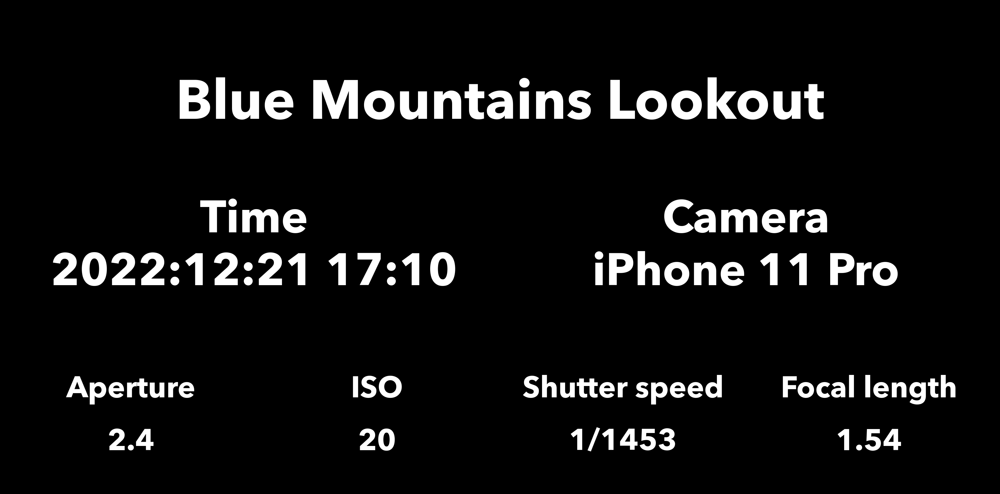

Resizing for social media.
3000 1427
Light
Watermark Size 906


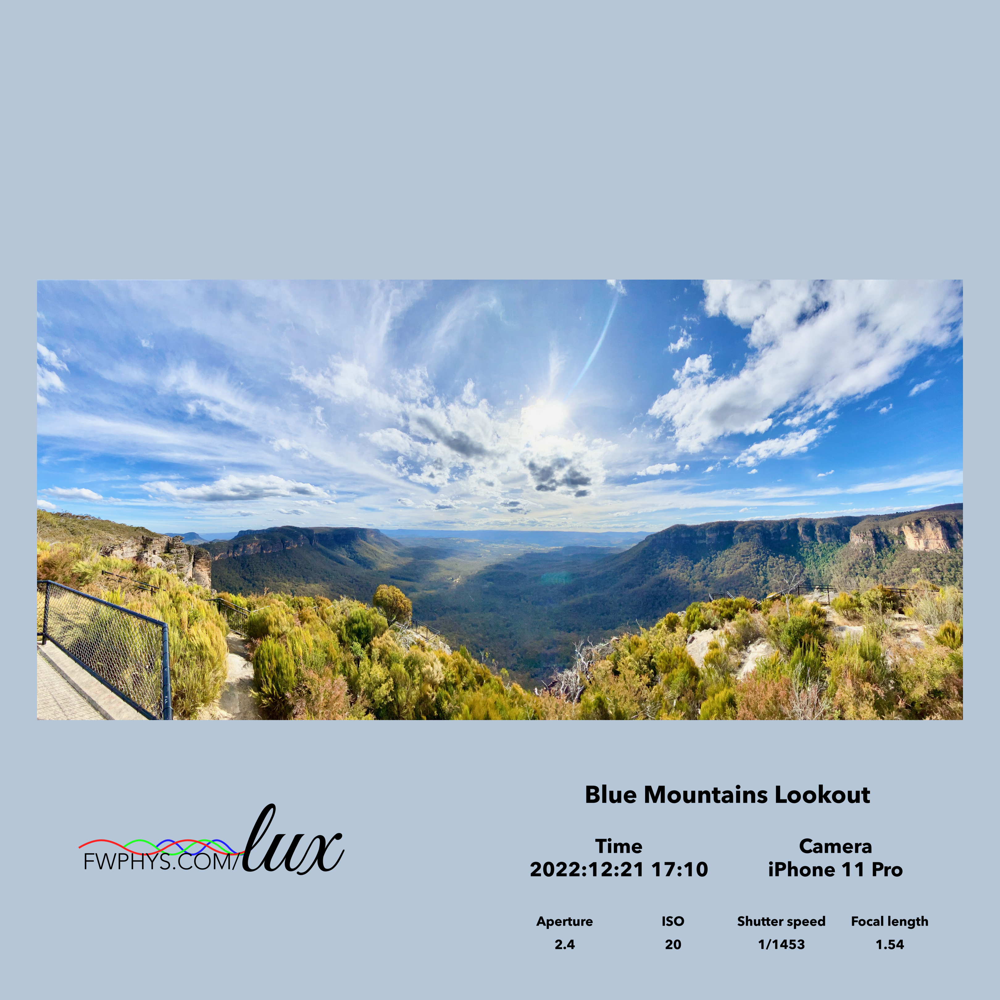

In [460]:
imagepath = "./Inputs/4.jpeg"

Label = Exif_to_Digest(imagepath)

image = Image.open(imagepath)

width, height = image.size

if Social and (width > 3000 or height > 3000):
    
    print("Resizing for social media.")
    
    if height > width:
        ratio = width / height 
        height = 3000
        width = int(height * ratio)
        
    else:
        ratio = height / width
        width = 3000
        height = int(width * ratio)

    
    image = image.resize((width,height))

image = add_border(image, Label,watermark_ratio = 1)

image

In [362]:
background_img = np.array(image).astype(float) 

array([[30., 33., 32.],
       [29., 33., 30.],
       [29., 33., 28.],
       ...,
       [87., 86., 73.],
       [88., 88., 76.],
       [91., 90., 79.]])